In [20]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import warnings
from tqdm.notebook import tqdm

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.preprocessing.image import load_img, array_to_img
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras import layers
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import BinaryCrossentropy

warnings.filterwarnings('ignore')

In [21]:


# Define dataset path (update accordingly)
dataset_path = "/kaggle/input/animefacedataset/images"
#output_path = "/kaggle/working/processed_images.npy"

# Get all image file names
image_files = [f for f in os.listdir(dataset_path) if f.endswith(('.png', '.jpg', '.jpeg'))]

# Initialize list for storing images
processed_images = []

# Process each image
for img_file in image_files:
    img_path = os.path.join(dataset_path, img_file)
    
    # Read image
    img = cv2.imread(img_path)
    if img is None:
        continue  # Skip if image cannot be read
    
    # Resize to 64x64
    img = cv2.resize(img, (64, 64))
    
    # Convert pixel values from [0, 255] to [-1, 1]
    img = img.astype(np.float32) / 127.5 - 1
    
    # Append to list
    processed_images.append(img)
    print(len(processed_images))
# Convert list to NumPy array
processed_images = np.array(processed_images)
print(processed_images.shape)
# Save as .npy file
#np.save(output_path, processed_images)

#print(f"Processed dataset saved at {output_path}")


1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
277


In [22]:
train_images = processed_images
#del processed_images

In [23]:
train_images[0].shape
del processed_images

In [24]:
## Create Generator & Discriminator Models

# latent dimension for random noise
LATENT_DIM = 100
# weight initializer
WEIGHT_INIT = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)
# no. of channels of the image
CHANNELS = 3 # for gray scale, keep it as 1

### Generator Model

#Generator Model will create new images similar to training data from random noise

model = Sequential(name='generator')

# 1d random noise
model.add(layers.Dense(8 * 8 * 512, input_dim=LATENT_DIM))
# model.add(layers.BatchNormalization())
model.add(layers.ReLU())

# convert 1d to 3d
model.add(layers.Reshape((8, 8, 512)))

# upsample to 16x16
model.add(layers.Conv2DTranspose(256, (4, 4), strides=(2, 2), padding='same', kernel_initializer=WEIGHT_INIT))
# model.add(layers.BatchNormalization())
model.add(layers.ReLU())

# upsample to 32x32
model.add(layers.Conv2DTranspose(128, (4, 4), strides=(2, 2), padding='same', kernel_initializer=WEIGHT_INIT))
# model.add(layers.BatchNormalization())
model.add(layers.ReLU())

# upsample to 64x64
model.add(layers.Conv2DTranspose(64, (4, 4), strides=(2, 2), padding='same', kernel_initializer=WEIGHT_INIT))
# model.add(layers.BatchNormalization())
model.add(layers.ReLU())

model.add(layers.Conv2D(CHANNELS, (4, 4), padding='same', activation='tanh'))

generator = model
generator.summary()

### Discriminator Model

#Discriminator model will classify the image from the generator to check whether it real (or) fake images.

model = Sequential(name='discriminator')
input_shape = (64, 64, 3)
alpha = 0.2

# create conv layers
model.add(layers.Conv2D(64, (4, 4), strides=(2, 2), padding='same', input_shape=input_shape))
model.add(layers.BatchNormalization())
model.add(layers.LeakyReLU(alpha=alpha))

model.add(layers.Conv2D(128, (4, 4), strides=(2, 2), padding='same', input_shape=input_shape))
model.add(layers.BatchNormalization())
model.add(layers.LeakyReLU(alpha=alpha))

model.add(layers.Conv2D(128, (4, 4), strides=(2, 2), padding='same', input_shape=input_shape))
model.add(layers.BatchNormalization())
model.add(layers.LeakyReLU(alpha=alpha))

model.add(layers.Flatten())
model.add(layers.Dropout(0.3))

# output class
model.add(layers.Dense(1, activation='sigmoid'))

discriminator = model
discriminator.summary()

## Create DCGAN

class DCGAN(keras.Model):
    def __init__(self, generator, discriminator, latent_dim):
        super().__init__()
        self.generator = generator
        self.discriminator = discriminator
        self.latent_dim = latent_dim
        self.g_loss_metric = keras.metrics.Mean(name='g_loss')
        self.d_loss_metric = keras.metrics.Mean(name='d_loss')

    @property
    def metrics(self):
        return [self.g_loss_metric, self.d_loss_metric]

    def compile(self, g_optimizer, d_optimizer, loss_fn):
        super(DCGAN, self).compile()
        self.g_optimizer = g_optimizer
        self.d_optimizer = d_optimizer
        self.loss_fn = loss_fn

    def train_step(self, real_images):
        # get batch size from the data
        batch_size = tf.shape(real_images)[0]
        # generate random noise
        random_noise = tf.random.normal(shape=(batch_size, self.latent_dim))

        # train the discriminator with real (1) and fake (0) images
        with tf.GradientTape() as tape:
            # compute loss on real images
            pred_real = self.discriminator(real_images, training=True)
            # generate real image labels
            real_labels = tf.ones((batch_size, 1))
            # label smoothing
            real_labels += 0.05 * tf.random.uniform(tf.shape(real_labels))
            d_loss_real = self.loss_fn(real_labels, pred_real)

            # compute loss on fake images
            fake_images = self.generator(random_noise)
            pred_fake = self.discriminator(fake_images, training=True)
            # generate fake labels
            fake_labels = tf.zeros((batch_size, 1))
            d_loss_fake = self.loss_fn(fake_labels, pred_fake)

            # total discriminator loss
            d_loss = (d_loss_real + d_loss_fake) / 2

        # compute discriminator gradients
        gradients = tape.gradient(d_loss, self.discriminator.trainable_variables)
        # update the gradients
        self.d_optimizer.apply_gradients(zip(gradients, self.discriminator.trainable_variables))


        # train the generator model
        labels = tf.ones((batch_size, 1))
        # generator want discriminator to think that fake images are real
        with tf.GradientTape() as tape:
            # generate fake images from generator
            fake_images = self.generator(random_noise, training=True)
            # classify images as real or fake
            pred_fake = self.discriminator(fake_images, training=True)
            # compute loss
            g_loss = self.loss_fn(labels, pred_fake)

        # compute gradients
        gradients = tape.gradient(g_loss, self.generator.trainable_variables)
        # update the gradients
        self.g_optimizer.apply_gradients(zip(gradients, self.generator.trainable_variables))

        # update states for both models
        self.d_loss_metric.update_state(d_loss)
        self.g_loss_metric.update_state(g_loss)

        return {'d_loss': self.d_loss_metric.result(), 'g_loss': self.g_loss_metric.result()}

class DCGANMonitor(keras.callbacks.Callback):
    def __init__(self, num_imgs=25, latent_dim=100):
        self.num_imgs = num_imgs
        self.latent_dim = latent_dim
        # create random noise for generating images
        self.noise = tf.random.normal([25, latent_dim])

    def on_epoch_end(self, epoch, logs=None):
        # generate the image from noise
        g_img = self.model.generator(self.noise)
        # denormalize the image
        g_img = (g_img * 127.5) + 127.5
        g_img.numpy()

        fig = plt.figure(figsize=(8, 8))
        for i in range(self.num_imgs):
            plt.subplot(5, 5, i+1)
            img = array_to_img(g_img[i])
            plt.imshow(img)
            plt.axis('off')
        # plt.savefig('epoch_{:03d}.png'.format(epoch))
        plt.show()

    def on_train_end(self, logs=None):
        self.model.generator.save('generator.h5')

dcgan = DCGAN(generator=generator, discriminator=discriminator, latent_dim=LATENT_DIM)

Model: "generator"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_2 (Dense)                      │ (None, 32768)               │       3,309,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ re_lu_4 (ReLU)                       │ (None, 32768)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ reshape_1 (Reshape)                  │ (None, 8, 8, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_3 (Conv2DTranspose) │ (None, 16, 16, 256)         │       2,097,408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ re_lu_5 (ReLU)                       │ (None, 16, 16, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_4 (Conv2DTranspose) │ (None, 32, 32, 128)         │         524,416 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ re_lu_6 (ReLU)                       │ (None, 32, 32, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_5 (Conv2DTranspose) │ (None, 64, 64, 64)          │         131,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ re_lu_7 (ReLU)                       │ (None, 64, 64, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 64, 64, 3)           │           3,075 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,065,603 (23.14 MB)

 Trainable params: 6,065,603 (23.14 MB)

 Non-trainable params: 0 (0.00 B)

Model: "discriminator"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_5 (Conv2D)                    │ (None, 32, 32, 64)          │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 32, 32, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_3 (LeakyReLU)            │ (None, 32, 32, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_6 (Conv2D)                    │ (None, 16, 16, 128)         │         131,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_4                │ (None, 16, 16, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_4 (LeakyReLU)            │ (None, 16, 16, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_7 (Conv2D)                    │ (None, 8, 8, 128)           │         262,272 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_5                │ (None, 8, 8, 128)           │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_5 (LeakyReLU)            │ (None, 8, 8, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 8192)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 8192)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 1)                   │           8,193 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 406,081 (1.55 MB)

 Trainable params: 405,441 (1.55 MB)

 Non-trainable params: 640 (2.50 KB)

In [25]:
D_LR = 0.0001
G_LR = 0.0003
dcgan.compile(g_optimizer=Adam(learning_rate=G_LR, beta_1=0.5), d_optimizer=Adam(learning_rate=D_LR, beta_1=0.5), loss_fn=BinaryCrossentropy())

Epoch 1/50
994/994 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - d_loss: 1.1792 - g_loss: 1.9851

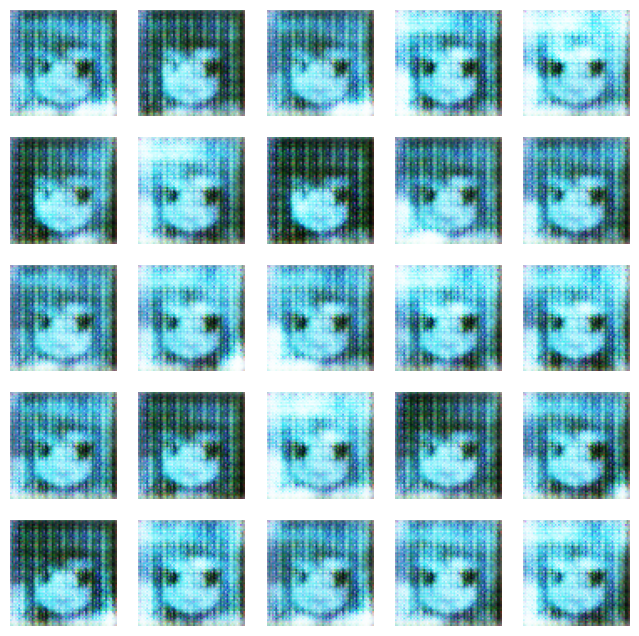

994/994 ━━━━━━━━━━━━━━━━━━━━ 85s 72ms/step - d_loss: 1.1786 - g_loss: 1.9856
Epoch 2/50
993/994 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - d_loss: 0.5876 - g_loss: 1.6711

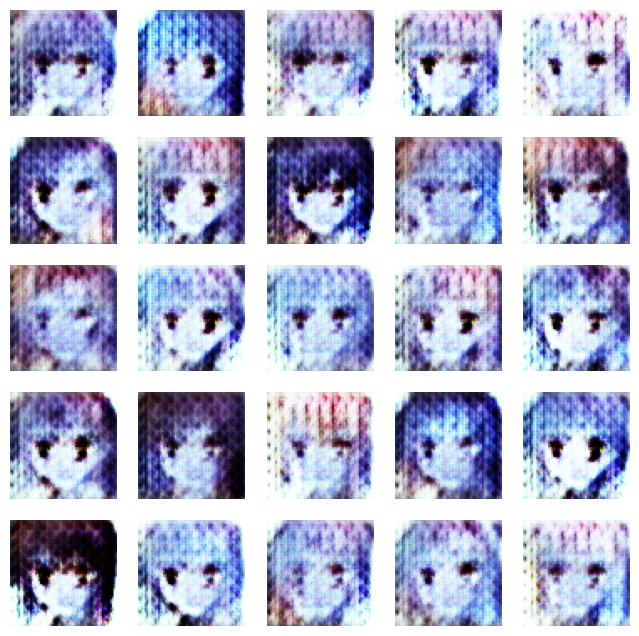

994/994 ━━━━━━━━━━━━━━━━━━━━ 63s 64ms/step - d_loss: 0.5876 - g_loss: 1.6711
Epoch 3/50
993/994 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - d_loss: 0.6220 - g_loss: 1.5834

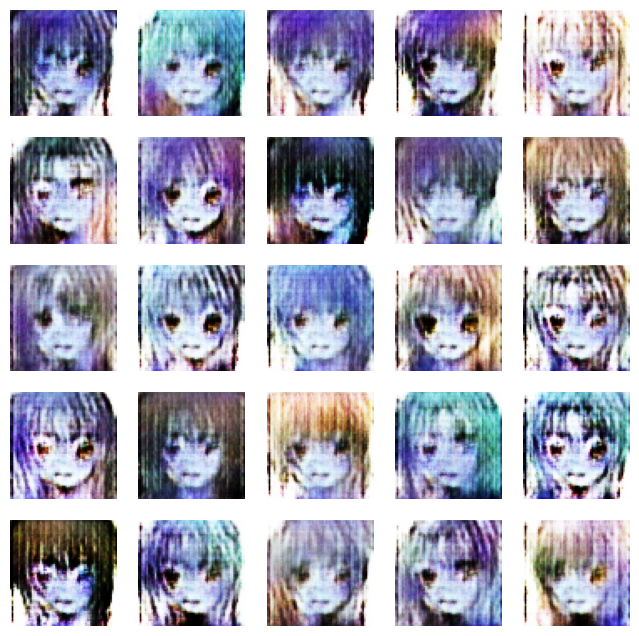

994/994 ━━━━━━━━━━━━━━━━━━━━ 63s 64ms/step - d_loss: 0.6221 - g_loss: 1.5831
Epoch 4/50
993/994 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - d_loss: 0.6767 - g_loss: 1.1868

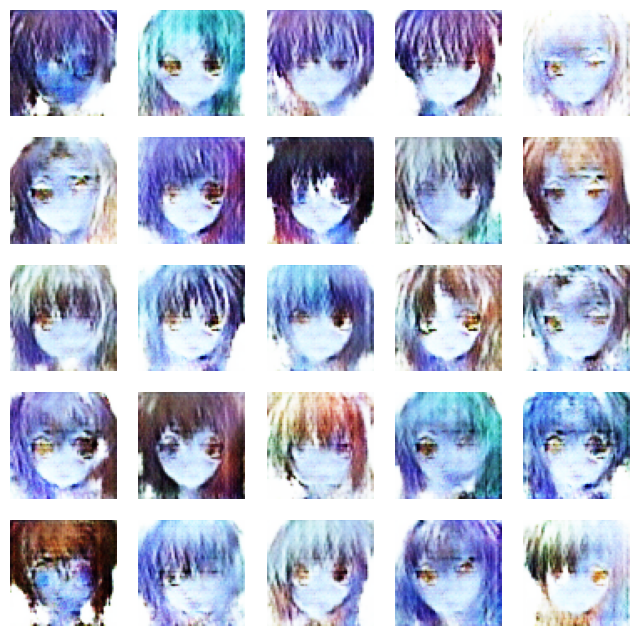

994/994 ━━━━━━━━━━━━━━━━━━━━ 63s 64ms/step - d_loss: 0.6767 - g_loss: 1.1868
Epoch 5/50
993/994 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - d_loss: 0.6859 - g_loss: 1.0226

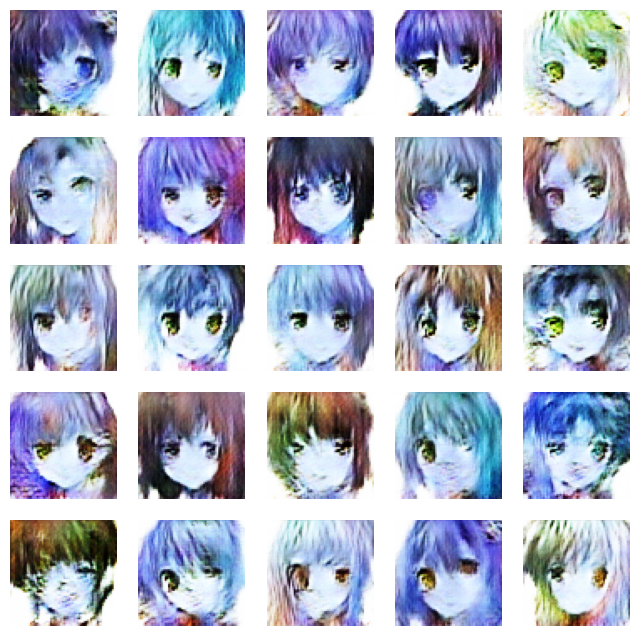

994/994 ━━━━━━━━━━━━━━━━━━━━ 63s 64ms/step - d_loss: 0.6859 - g_loss: 1.0225
Epoch 6/50
993/994 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - d_loss: 0.7298 - g_loss: 0.8244

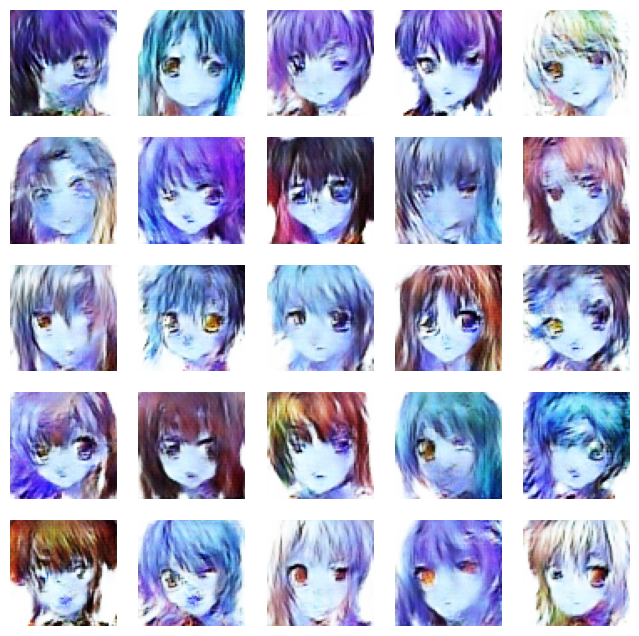

994/994 ━━━━━━━━━━━━━━━━━━━━ 63s 63ms/step - d_loss: 0.7298 - g_loss: 0.8243
Epoch 7/50
993/994 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - d_loss: 0.7314 - g_loss: 0.7568

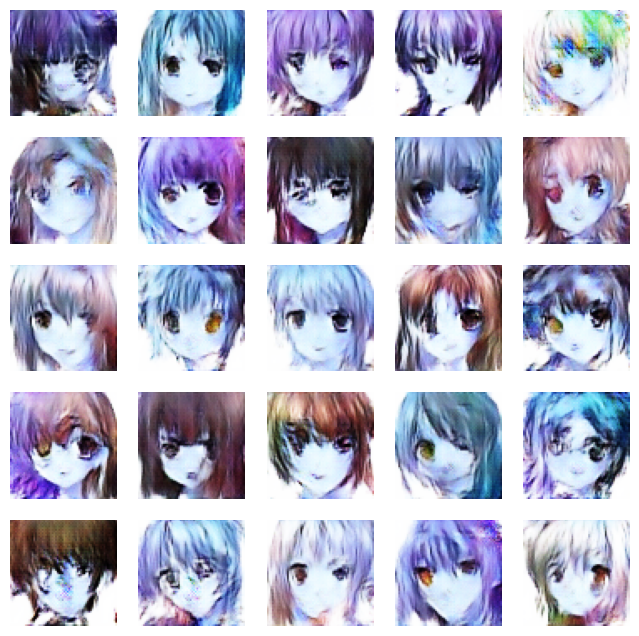

994/994 ━━━━━━━━━━━━━━━━━━━━ 63s 63ms/step - d_loss: 0.7314 - g_loss: 0.7568
Epoch 8/50
993/994 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - d_loss: 0.7158 - g_loss: 0.7493

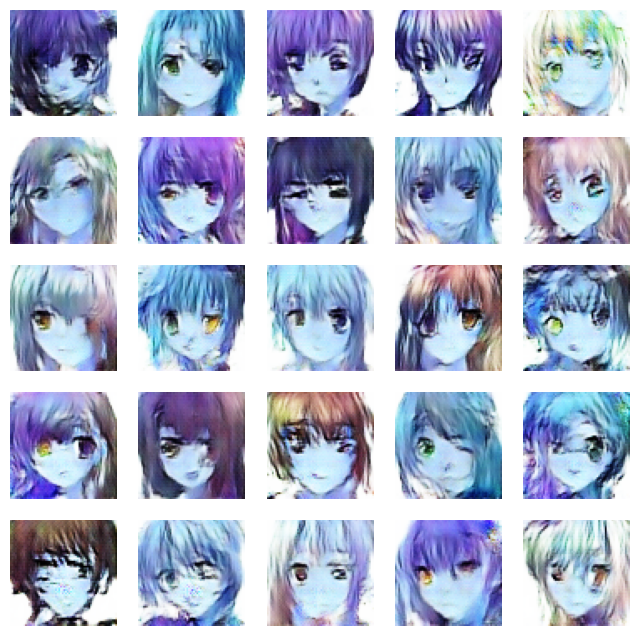

994/994 ━━━━━━━━━━━━━━━━━━━━ 63s 63ms/step - d_loss: 0.7158 - g_loss: 0.7493
Epoch 9/50
993/994 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - d_loss: 0.7138 - g_loss: 0.7352

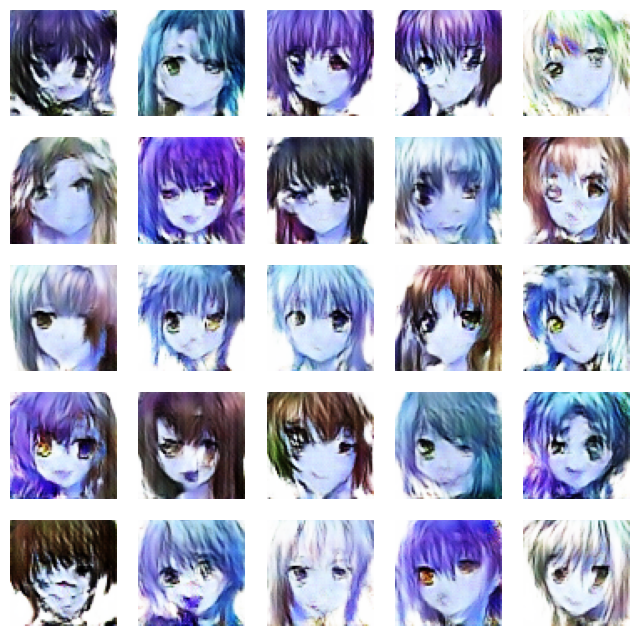

994/994 ━━━━━━━━━━━━━━━━━━━━ 63s 63ms/step - d_loss: 0.7138 - g_loss: 0.7352
Epoch 10/50
993/994 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - d_loss: 0.7106 - g_loss: 0.7255

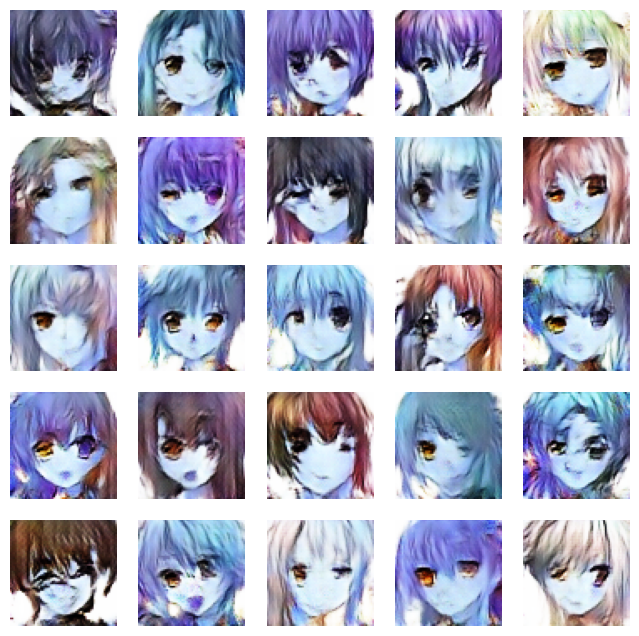

994/994 ━━━━━━━━━━━━━━━━━━━━ 63s 63ms/step - d_loss: 0.7106 - g_loss: 0.7255
Epoch 11/50
993/994 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - d_loss: 0.7100 - g_loss: 0.7193

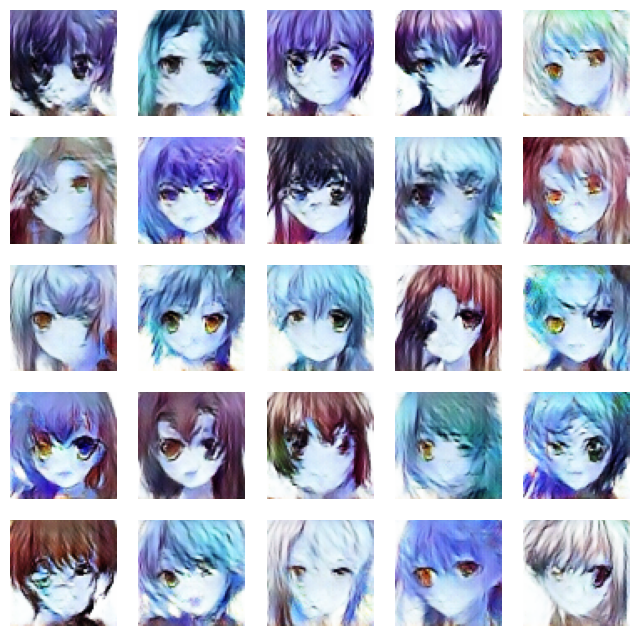

994/994 ━━━━━━━━━━━━━━━━━━━━ 63s 64ms/step - d_loss: 0.7100 - g_loss: 0.7193
Epoch 12/50
993/994 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - d_loss: 0.7068 - g_loss: 0.7165

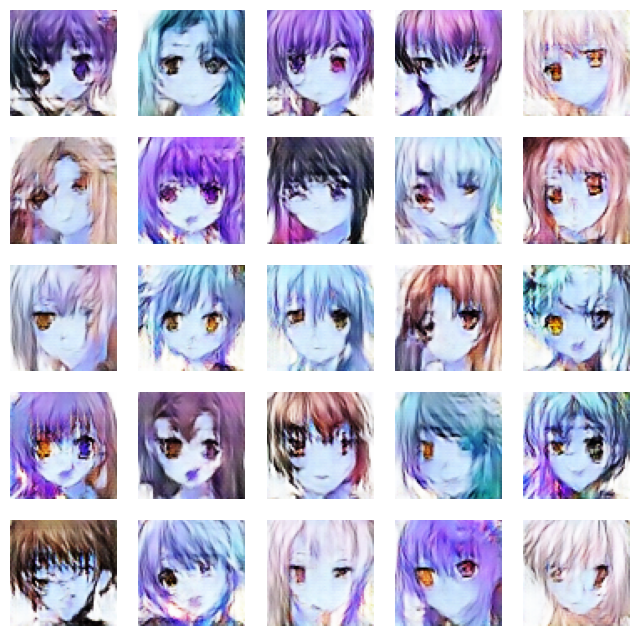

994/994 ━━━━━━━━━━━━━━━━━━━━ 63s 63ms/step - d_loss: 0.7068 - g_loss: 0.7165
Epoch 13/50
993/994 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - d_loss: 0.7053 - g_loss: 0.7106

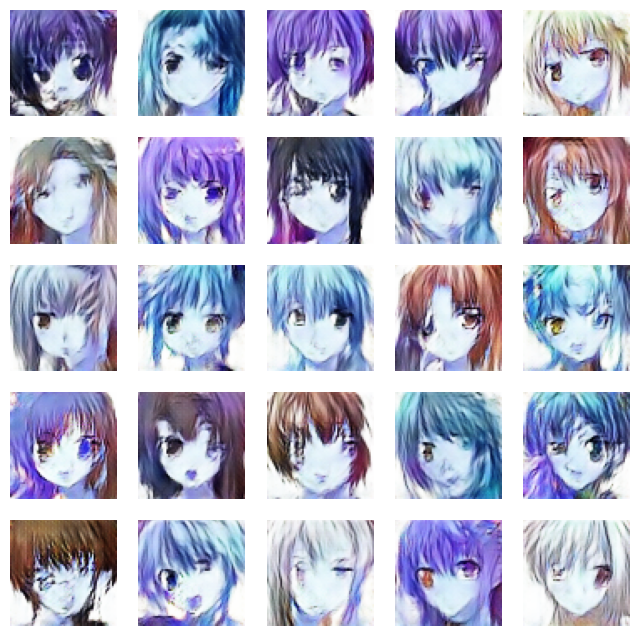

994/994 ━━━━━━━━━━━━━━━━━━━━ 63s 63ms/step - d_loss: 0.7053 - g_loss: 0.7106
Epoch 14/50
993/994 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - d_loss: 0.7047 - g_loss: 0.7087

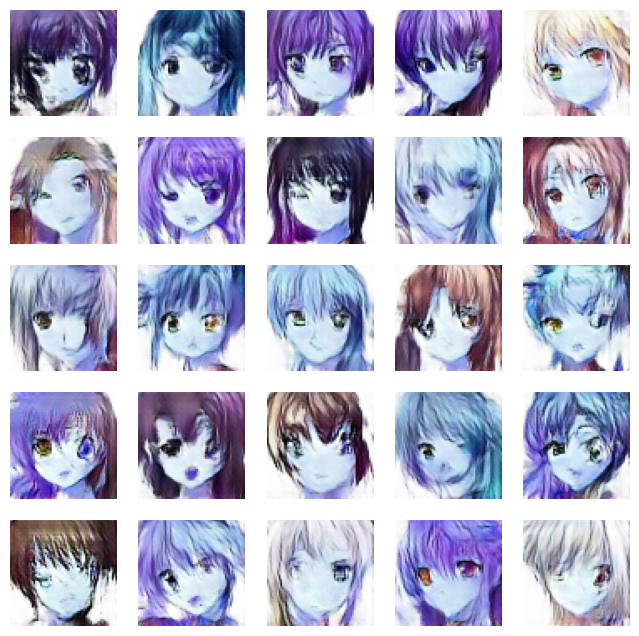

994/994 ━━━━━━━━━━━━━━━━━━━━ 64s 64ms/step - d_loss: 0.7047 - g_loss: 0.7087
Epoch 15/50
934/994 ━━━━━━━━━━━━━━━━━━━━ 3s 63ms/step - d_loss: 0.7030 - g_loss: 0.7064

In [ ]:
N_EPOCHS = 50
history = dcgan.fit(train_images, epochs=N_EPOCHS, batch_size=64, callbacks=[DCGANMonitor()])


In [ ]:
noise = tf.random.normal([1, 100])
fig = plt.figure(figsize=(3, 3))
# generate the image from noise
g_img = dcgan.generator(noise)
# denormalize the image
g_img = (g_img * 127.5) + 127.5
g_img.numpy()
img = array_to_img(g_img[0])
plt.imshow(img)
plt.axis('off')
# plt.savefig('epoch_{:03d}.png'.format(epoch))
plt.show()

In [ ]:
# Extract losses from history
gen_loss = history.history['gen_loss']  # Replace with actual key if different
disc_loss = history.history['disc_loss']  # Replace with actual key if different

# Plot the losses
plt.figure(figsize=(10, 5))
plt.plot(gen_loss, label="Generator Loss")
plt.plot(disc_loss, label="Discriminator Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("DCGAN Training Loss")
plt.legend()
plt.grid()
plt.show()



In [ ]:
# Define save paths
GENERATOR_PATH = "/kaggle/working/generator_model.h5"
DISCRIMINATOR_PATH = "/kaggle/working/discriminator_model.h5"

# Save models
dcgan.generator.save(GENERATOR_PATH)
dcgan.discriminator.save(DISCRIMINATOR_PATH)